Leave-one-group-out for the immune response prediction

In [1]:
import warnings
from anndata import ImplicitModificationWarning
warnings.filterwarnings("ignore", category=ImplicitModificationWarning)
warnings.filterwarnings("ignore")

In [2]:
import os,sys
sys.path.append(os.path.realpath(os.path.join(os.getcwd(), '..')))
import numpy as np
import scanpy as sc
import vqtcr as vq

In [3]:
path_base = '/mnt/d/Dataset/vqTCR/10xGenomics/'
path_data = path_base + 'avidity_esm.h5ad'

In [4]:
vq.set_random_seed(2025)
adata = sc.read_h5ad(path_data)
adata = adata[adata.obs['binding_name'].isin(vq.HIGH_COUNT_ANTIGENS)]
adata

View of AnnData object with n_obs × n_vars = 61096 × 5000
    obs: 'is_cell', 'high_confidence', 'multi_chain', 'extra_chains', 'IR_VJ_1_c_call', 'IR_VJ_2_c_call', 'IR_VDJ_1_c_call', 'IR_VDJ_2_c_call', 'IR_VJ_1_consensus_count', 'IR_VJ_2_consensus_count', 'IR_VDJ_1_consensus_count', 'IR_VDJ_2_consensus_count', 'IR_VJ_1_d_call', 'IR_VJ_2_d_call', 'IR_VDJ_1_d_call', 'IR_VDJ_2_d_call', 'IR_VJ_1_duplicate_count', 'IR_VJ_2_duplicate_count', 'IR_VDJ_1_duplicate_count', 'IR_VDJ_2_duplicate_count', 'IR_VJ_1_j_call', 'IR_VJ_2_j_call', 'IR_VDJ_1_j_call', 'IR_VDJ_2_j_call', 'IR_VJ_1_junction', 'IR_VJ_2_junction', 'IR_VDJ_1_junction', 'IR_VDJ_2_junction', 'IR_VJ_1_junction_aa', 'IR_VJ_2_junction_aa', 'IR_VDJ_1_junction_aa', 'IR_VDJ_2_junction_aa', 'IR_VJ_1_locus', 'IR_VJ_2_locus', 'IR_VDJ_1_locus', 'IR_VDJ_2_locus', 'IR_VJ_1_productive', 'IR_VJ_2_productive', 'IR_VDJ_1_productive', 'IR_VDJ_2_productive', 'IR_VJ_1_v_call', 'IR_VJ_2_v_call', 'IR_VDJ_1_v_call', 'IR_VDJ_2_v_call', 'has_ir', 'barcode',

In [5]:
params = vq.get_pred_config(lr=1e-4, latent_dim=64, dropout=0.2, 
                            num_subspace=32, codewords_per_space=64)
params['epoch'] = 20
params['pred']['dim_latent'] = 2*64
params

{'dim_latent': 64,
 'batch_size': 512,
 'lr': 0.0001,
 'dropout': 0.2,
 'epoch': 20,
 'early': 10,
 'dataset': '',
 'save_path': '',
 'direction': 'max',
 'weight_decay': 0.0001,
 'loss_weight': [1.0, 1.0, 1.0, 1.0],
 'gex': {'dim_latent': 64, 'act': 'elu', 'norm': True},
 'tcr': {'esm_type': 'facebook/esm2_t6_8M_UR50D',
  'kmer_kernels': [1, 3, 5, 7],
  'dim_latent': 64,
  'dim_emb': 64,
  'num_heads': 8,
  'forward_expansion': 4,
  'dropout': 0.2,
  'num_encoder': 2,
  'num_decoder': 2,
  'mask_rate': 0.15,
  'beta_only': False,
  'esm_tokens': True},
 'fus': {'dim_latent': 64, 'dropout': 0.2, 'film_reg': 1.0},
 'pty': {'dim_latent': 128,
  'num_subspace': 32,
  'codewords_per_space': 64,
  'eps': 1e-05,
  'init_scale': 1.0,
  'ema_decay': 0.99,
  'commitment_beta': 0.25,
  'use_cosine': True,
  'dead_code_interval': 1000,
  'dead_code_threshold': 0.0001,
  'dead_code_topk': 16,
  'diversity_weight': 0.001},
 'pred': {'dim_latent': 128, 'dropout': 0.2, 'n_labels': 8}}

Leave one donor out(LoDonor) TCR-pMHC binding prediction

pretrain on all donors

Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
Some weights of EsmModel were not initialized from the model checkpoint at facebook/esm2_t6_8M_UR50D and are newly initialized: ['esm.pooler.dense.bias', 'esm.pooler.dense.weight']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.


warmup codebook:   0%|          | 0/10 [00:00<?, ?it/s]

1.472695231437683 3.546380043029785 0.6809260845184326
1.281015157699585 3.487766742706299 0.6655604243278503
1.0998233556747437 3.454538583755493 0.6541275978088379
0.9316264390945435 3.4499969482421875 0.644219696521759
0.7938710451126099 3.439265727996826 0.6345335841178894
0.6816099286079407 3.421353578567505 0.6247962117195129
0.6003409624099731 3.4155921936035156 0.6156996488571167
0.5328773260116577 3.3942391872406006 0.606646716594696
0.48008692264556885 3.3687264919281006 0.5975104570388794
0.43737727403640747 3.3620314598083496 0.5886640548706055
0.4044763445854187 3.3476853370666504 0.5796509981155396
0.3744800090789795 3.3320541381835938 0.5708087086677551
0.35885360836982727 3.3293190002441406 0.5623623728752136
0.34035128355026245 3.3044490814208984 0.5536012053489685
0.3307301998138428 3.2949748039245605 0.54509037733078
0.3221978545188904 3.269589424133301 0.5364232063293457
0.3108955919742584 3.2569968700408936 0.5279636979103088
0.300750732421875 3.24613881111145 0.51

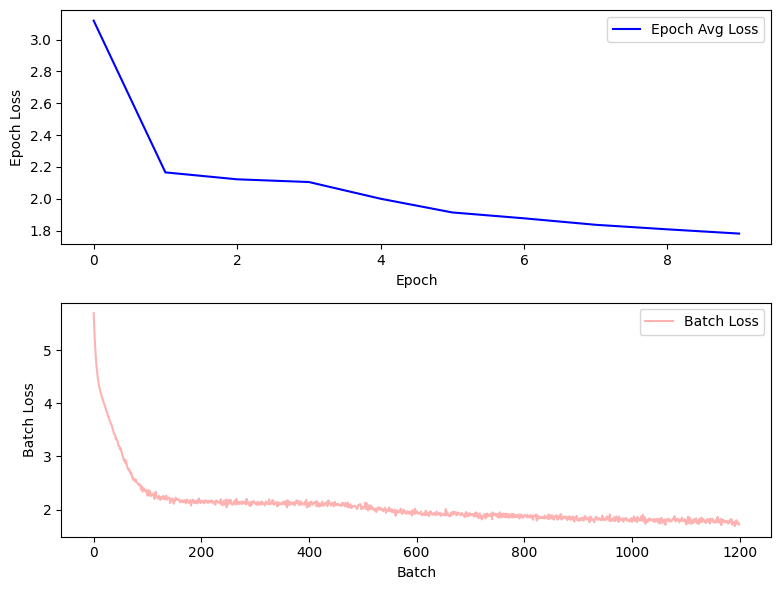

Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 4D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=1670.6 imbalance=1.101 nsplit=0        
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 4D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=1404.3 imbalance=1.128 nsplit=0        
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 4D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=1676.87 imbalance=1.103 nsplit=0       
Sampling a subset of 16384 / 61096 for training
Clustering 16384 points in 4D to 64 clusters, redo 1 times, 20 iterations
  Preprocessing in 0.00 s
  Iteration 19 (0.01 s, search 0.00 s): objective=1632.33 imbalance=1.068 nsplit=0       
Sampling a subset of 16384 / 61096 for training


Pre-Training:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [55.4556999206543, 56.19416427612305, 56.973751068115234, 58.746395111083984, 58.48640060424805, 55.95811080932617, 58.65889358520508, 55.849857330322266, 57.16230010986328, 57.74082565307617, 56.64148712158203, 54.05977249145508, 56.89613342285156, 56.83750534057617, 57.987274169921875, 56.521236419677734, 57.75531005859375, 58.84059143066406, 57.210350036621094, 57.757568359375, 55.844261169433594, 56.913631439208984, 56.815879821777344, 57.711097717285156, 59.21025085449219, 58.08180618286133, 58.372501373291016, 57.302032470703125, 56.73287582397461, 56.45920181274414, 54.449954986572266, 56.90742111206055] dead_rate_per_codebook[0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0]
0.11831696331501007 1.6745328903198242 0.008334987796843052 0.0015921052545309067
perplexity_per_codebook [55.004119873046875, 55.927913665771484, 56.71199

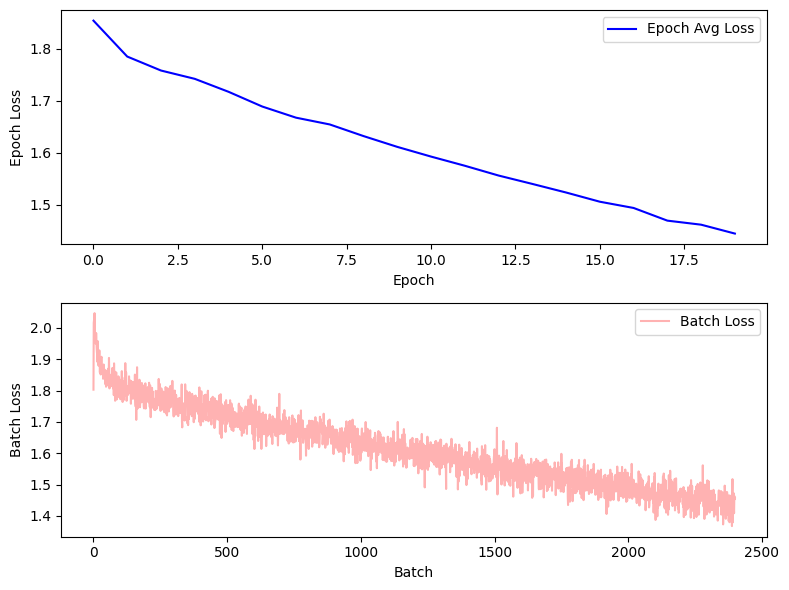

In [6]:
vqtcr = vq.vqTCR(params, adata, labels='binding_name')
vqtcr.pretrain(col_name='donor', 
               set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'],
               sample_mode='clonotype', 
               shuffle=False,
               labels=None,
               visual=True)

perplexity_per_codebook [21.82184410095215, 19.700183868408203, 14.13123893737793, 20.818815231323242, 22.04790687561035, 21.38974380493164, 22.63458824157715, 20.763694763183594, 21.191184997558594, 22.202373504638672, 20.844383239746094, 19.46280860900879, 19.122339248657227, 19.51207733154297, 21.848133087158203, 19.133785247802734, 48.66971206665039, 40.9368782043457, 42.4759521484375, 43.495826721191406, 51.106361389160156, 47.55280303955078, 49.25018310546875, 45.7395133972168, 43.35291290283203, 39.07960891723633, 46.16672134399414, 48.47294235229492, 54.33599090576172, 44.7496223449707, 49.23401641845703, 34.740840911865234] dead_rate_per_codebook[0.125, 0.203125, 0.15625, 0.171875, 0.140625, 0.15625, 0.0625, 0.1875, 0.1875, 0.109375, 0.15625, 0.21875, 0.15625, 0.15625, 0.109375, 0.203125, 0.015625, 0.0625, 0.078125, 0.046875, 0.0, 0.015625, 0.015625, 0.015625, 0.03125, 0.0625, 0.015625, 0.0, 0.015625, 0.03125, 0.015625, 0.21875]
perplexity_per_codebook [21.278806686401367, 19.

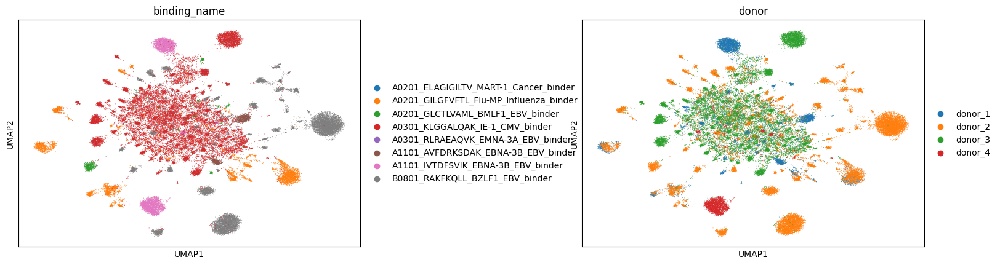

In [7]:
adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
# tcr latent space
sc.pp.neighbors(adata, use_rep='htcell')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

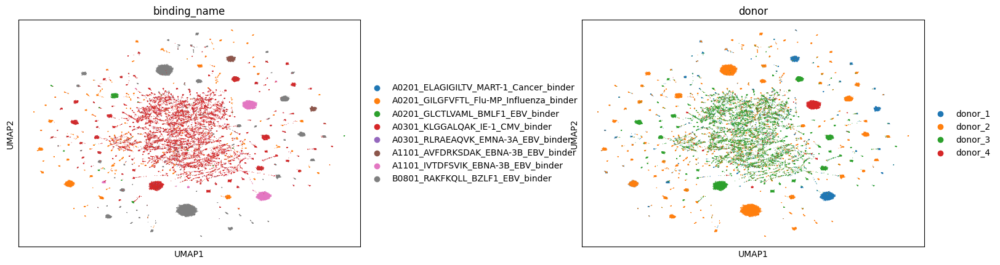

In [8]:
# tcr latent space
sc.pp.neighbors(adata, use_rep='htcr')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

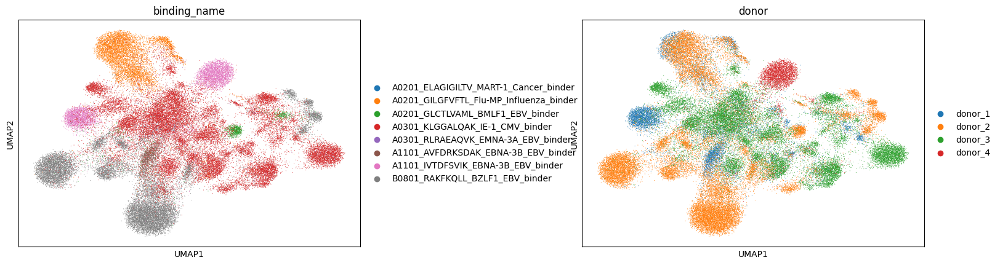

In [9]:
# gex residual latent space
sc.pp.neighbors(adata, use_rep='hgex')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['binding_name', 'donor'], wspace=0.5)

prediction training on remianing patients and test on leave-out patient

In [10]:
# test_score = vqtcr.compute_metrics(metrics='knn_prediction', eval_set='test')
record = {}
adata = vqtcr.get_latent(adata,col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
adata_train = adata[adata.obs['set'].isin(['train', 'valid'])]
adata_valid = adata[adata.obs['set']=='test']

knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                            adata_train.obs['binding_name'], 
                            adata_valid.obs['binding_name'])
record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
record['knn_prediction']

perplexity_per_codebook [21.82184410095215, 19.700183868408203, 14.13123893737793, 20.818815231323242, 22.04790687561035, 21.38974380493164, 22.63458824157715, 20.763694763183594, 21.191184997558594, 22.202373504638672, 20.844383239746094, 19.46280860900879, 19.122339248657227, 19.51207733154297, 21.848133087158203, 19.133785247802734, 48.66971206665039, 40.9368782043457, 42.4759521484375, 43.495826721191406, 51.106361389160156, 47.55280303955078, 49.25018310546875, 45.7395133972168, 43.35291290283203, 39.07960891723633, 46.16672134399414, 48.47294235229492, 54.33599090576172, 44.7496223449707, 49.23401641845703, 34.740840911865234] dead_rate_per_codebook[0.125, 0.203125, 0.15625, 0.171875, 0.140625, 0.15625, 0.0625, 0.1875, 0.1875, 0.109375, 0.15625, 0.21875, 0.15625, 0.15625, 0.109375, 0.203125, 0.015625, 0.0625, 0.078125, 0.046875, 0.0, 0.015625, 0.015625, 0.015625, 0.03125, 0.0625, 0.015625, 0.0, 0.015625, 0.03125, 0.015625, 0.21875]
perplexity_per_codebook [21.278806686401367, 19.

0.4772197362286346

In [11]:
adata = vq.split_adata(adata, split_col='clonotype', random_seed=2025)
record = {}
adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
adata_train = adata[adata.obs['set']=='train']
adata_valid = adata[adata.obs['set']=='test']

knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                            adata_train.obs['binding_name'], 
                            adata_valid.obs['binding_name'])
record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
record['knn_prediction']

perplexity_per_codebook [21.82184410095215, 19.700183868408203, 14.13123893737793, 20.818815231323242, 22.04790687561035, 21.38974380493164, 22.63458824157715, 20.763694763183594, 21.191184997558594, 22.202373504638672, 20.844383239746094, 19.46280860900879, 19.122339248657227, 19.51207733154297, 21.848133087158203, 19.133785247802734, 48.66971206665039, 40.9368782043457, 42.4759521484375, 43.495826721191406, 51.106361389160156, 47.55280303955078, 49.25018310546875, 45.7395133972168, 43.35291290283203, 39.07960891723633, 46.16672134399414, 48.47294235229492, 54.33599090576172, 44.7496223449707, 49.23401641845703, 34.740840911865234] dead_rate_per_codebook[0.125, 0.203125, 0.15625, 0.171875, 0.140625, 0.15625, 0.0625, 0.1875, 0.1875, 0.109375, 0.15625, 0.21875, 0.15625, 0.15625, 0.109375, 0.203125, 0.015625, 0.0625, 0.078125, 0.046875, 0.0, 0.015625, 0.015625, 0.015625, 0.03125, 0.0625, 0.015625, 0.0, 0.015625, 0.03125, 0.015625, 0.21875]
perplexity_per_codebook [21.278806686401367, 19.

0.8027370869236354

In [12]:
from sklearn.model_selection import LeaveOneGroupOut, LeavePGroupsOut
logo = LeaveOneGroupOut()
all_test_metrics = []
donor_ids = adata.obs.donor.to_numpy()
import numpy as np
for train_valid_idx, test_idx in logo.split(X=adata.X, groups=donor_ids):
    test_donor = donor_ids[test_idx][0]
    print(f"\n=== test on {test_donor} ===")
    adata.obs.loc[adata.obs.index[train_valid_idx], 'set']='train'
    adata.obs.loc[adata.obs.index[test_idx], 'set'] = 'test'
    record = {}
    adata = vqtcr.get_latent(adata, col_name='donor', set_name=['donor_1', 'donor_2', 'donor_3', 'donor_4'])
    adata_train = adata[adata.obs['set']=='train']
    adata_valid = adata[adata.obs['set']=='test']

    knn_scores = vq.get_knn_cls(adata_train.obsm['htcr'], adata_valid.obsm['htcr'],
                                adata_train.obs['binding_name'], 
                                adata_valid.obs['binding_name'])
    record['knn_prediction'] = knn_scores['weighted avg']['f1-score']
    print(record['knn_prediction'])


=== test on donor_1 ===
perplexity_per_codebook [21.82184410095215, 19.700183868408203, 14.13123893737793, 20.818815231323242, 22.04790687561035, 21.38974380493164, 22.63458824157715, 20.763694763183594, 21.191184997558594, 22.202373504638672, 20.844383239746094, 19.46280860900879, 19.122339248657227, 19.51207733154297, 21.848133087158203, 19.133785247802734, 48.66971206665039, 40.9368782043457, 42.4759521484375, 43.495826721191406, 51.106361389160156, 47.55280303955078, 49.25018310546875, 45.7395133972168, 43.35291290283203, 39.07960891723633, 46.16672134399414, 48.47294235229492, 54.33599090576172, 44.7496223449707, 49.23401641845703, 34.740840911865234] dead_rate_per_codebook[0.125, 0.203125, 0.15625, 0.171875, 0.140625, 0.15625, 0.0625, 0.1875, 0.1875, 0.109375, 0.15625, 0.21875, 0.15625, 0.15625, 0.109375, 0.203125, 0.015625, 0.0625, 0.078125, 0.046875, 0.0, 0.015625, 0.015625, 0.015625, 0.03125, 0.0625, 0.015625, 0.0, 0.015625, 0.03125, 0.015625, 0.21875]
perplexity_per_codebook

In [13]:
all_test_metrics = []
for train_valid_idx, test_idx in logo.split(X=adata.X, groups=donor_ids):
    test_donor = donor_ids[test_idx][0]
    print(f"\n=== test on {test_donor} ===")
    # split train-valid dataset
    adata_train_val = adata[train_valid_idx]
    train, val = vq.split_dataset(adata_train_val, split_ratio=0.25, 
                                  split_col='clonotype', random_seed=2025)
    adata.obs['set'] = None
    adata.obs.loc[train.obs.index, 'set'] = 'train'
    adata.obs.loc[val.obs.index, 'set'] = 'valid'
    adata.obs.loc[adata.obs.index[test_idx], 'set'] = 'test'
    trainloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['train'],
                                     sample_mode='clonotype',
                                     shuffle=False, 
                                     labels='binding_name')
    validloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['valid'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    testloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['test'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    best_score = vqtcr.predict_train(trainloader, validloader)
    print(f'best score in validation: {best_score}')
    
    test_metrics = vqtcr.predict_test(testloader)
    all_test_metrics.append(test_metrics)
    
metric = 'weighted'
print("\n" + "="*60)
print("LOGO Results:")
for i, metrics in enumerate(all_test_metrics):
        print(f"Donor {np.unique(donor_ids)[i]}: "
              f"f1: {metrics[f'f1_{metric}']:.3f}, "
              f"AUC-ROC: {metrics[f'auc_roc_{metric}']:.3f}, "
              f"AUC-PR: {metrics[f'auc_pr_{metric}']:.3f}")
    
mean_f1 = np.nanmean([m[f'f1_{metric}'] for m in all_test_metrics])
mean_auc_roc = np.nanmean([m[f'auc_roc_{metric}'] for m in all_test_metrics])
mean_auc_pr = np.nanmean([m[f'auc_pr_{metric}'] for m in all_test_metrics])

print(f"\n Average: "
        f"fa: {mean_f1:.3f} ± {np.nanstd([m[f'f1_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-ROC: {mean_auc_roc:.3f} ± {np.nanstd([m[f'auc_roc_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-PR: {mean_auc_pr:.3f} ± {np.nanstd([m[f'auc_pr_{metric}'] for m in all_test_metrics]):.3f}")


=== test on donor_1 ===


Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [52.82203674316406, 54.170230865478516, 53.983036041259766, 53.5616340637207, 48.78619384765625, 53.01618576049805, 53.21793746948242, 55.046836853027344, 54.22236633300781, 55.99128723144531, 51.52573776245117, 52.37067413330078, 55.839149475097656, 51.267330169677734, 52.867984771728516, 49.37147521972656, 49.517189025878906, 57.57871627807617, 57.03901290893555, 52.77326965332031, 56.20689392089844, 58.53871154785156, 57.558677673339844, 53.710296630859375, 58.25341033935547, 56.20180130004883, 56.07694625854492, 57.7253532409668, 54.23088836669922, 52.90414810180664, 56.20978927612305, 54.15057373046875] dead_rate_per_codebook[0.046875, 0.0, 0.0, 0.03125, 0.03125, 0.0, 0.015625, 0.03125, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.046875, 0.0, 0.03125, 0.046875, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0]
perplexity_per_codebook [50.19290542602539, 54.84502029418945, 52.89181137084961, 52.83196258544922, 50.2804031

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [50.89822769165039, 49.843727111816406, 55.454612731933594, 52.133541107177734, 48.538551330566406, 53.85930252075195, 51.76185989379883, 56.411109924316406, 57.29776382446289, 55.97401809692383, 50.80904769897461, 49.41579818725586, 53.246402740478516, 55.634185791015625, 52.088191986083984, 48.380863189697266, 49.756019592285156, 55.5859260559082, 54.920413970947266, 50.11604309082031, 55.492305755615234, 57.30145263671875, 54.04893493652344, 51.88080596923828, 58.94544982910156, 56.23638153076172, 56.424537658691406, 52.39702606201172, 54.844051361083984, 55.18455123901367, 53.81576156616211, 52.237266540527344] dead_rate_per_codebook[0.03125, 0.03125, 0.0, 0.015625, 0.0625, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.03125, 0.015625, 0.0, 0.0, 0.015625, 0.046875, 0.046875, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.03125, 0.0, 0.0, 0.015625, 0.03125, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [51.385650634765625, 51.37577438354492, 54.08314514160156, 49.034717559814

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [52.19795227050781, 50.46299743652344, 48.94602966308594, 50.053890228271484, 46.170108795166016, 51.733001708984375, 54.55552291870117, 52.45107650756836, 52.32846450805664, 54.469886779785156, 54.778499603271484, 49.45677185058594, 50.124969482421875, 51.857269287109375, 50.306663513183594, 43.18354797363281, 53.62452697753906, 49.20806884765625, 46.34825134277344, 49.30304718017578, 52.408363342285156, 53.069602966308594, 52.73847961425781, 56.34336853027344, 50.57121276855469, 45.63594436645508, 53.7255859375, 54.32157516479492, 56.157814025878906, 50.96611022949219, 55.402099609375, 39.25960159301758] dead_rate_per_codebook[0.0, 0.046875, 0.0, 0.015625, 0.0625, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.015625, 0.03125, 0.03125, 0.046875, 0.0625, 0.0, 0.015625, 0.078125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.03125, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.078125]
perplexity_per_codebook [52.52498245239258, 51.56634521484375, 49.955223083496094, 50.54327392578125,

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [52.182647705078125, 54.11241149902344, 53.81571960449219, 53.05617141723633, 50.79464340209961, 53.04926681518555, 54.48894119262695, 56.374271392822266, 54.69443130493164, 55.98611068725586, 53.74650955200195, 52.20843505859375, 55.05476760864258, 54.43547058105469, 54.06548309326172, 49.90263366699219, 51.64712905883789, 57.80214309692383, 54.25751495361328, 53.84187698364258, 57.50811767578125, 57.882904052734375, 54.99305725097656, 52.99989700317383, 56.681068420410156, 53.48497772216797, 57.60222625732422, 57.05642318725586, 54.99308395385742, 52.10830307006836, 56.813011169433594, 50.778099060058594] dead_rate_per_codebook[0.0, 0.0, 0.0, 0.015625, 0.03125, 0.03125, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.03125, 0.0, 0.0, 0.015625, 0.03125, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [51.14145278930664, 52.908756256103516, 52.811885833740234, 54.37774658203125, 48.518856048583984, 55.01

In [14]:
all_test_metrics = []
for i in range(5):
    adata = vq.split_adata(adata, split_col='clonotype', random_seed=i)
    trainloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['train'],
                                     sample_mode='clonotype',
                                     shuffle=False, 
                                     labels='binding_name')
    validloader = vq.get_dataloader(adata=adata, 
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['valid'],
                                     sample_mode=None,
                                     shuffle=False, 
                                     labels='binding_name')
    testloader = vq.get_dataloader(adata=adata,
                                     batch_size=params['batch_size'],
                                     col_name='set',
                                     set_name=['test'],
                                     sample_mode=None,
                                     shuffle=False,
                                     labels='binding_name')
    best_score = vqtcr.predict_train(trainloader, validloader)
    print(f'best score in validation: {best_score}')
    
    test_metrics = vqtcr.predict_test(testloader)
    all_test_metrics.append(test_metrics)

print("\n" + "="*60)
print("LOGO交叉验证最终结果:")
for i, metrics in enumerate(all_test_metrics):
        print(f"splite {i}: "
              f"F1: {metrics[f'f1_{metric}']:.3f}, "
              f"AUC-ROC: {metrics[f'auc_roc_{metric}']:.3f}, "
              f"AUC-PR: {metrics[f'auc_pr_{metric}']:.3f}")
    
# 计算平均性能
mean_f1 = np.nanmean([m[f'f1_{metric}'] for m in all_test_metrics])
mean_auc_roc = np.nanmean([m[f'auc_roc_{metric}'] for m in all_test_metrics])
mean_auc_pr = np.nanmean([m[f'auc_pr_{metric}'] for m in all_test_metrics])

print(f"\n平均性能: "
        f"F1: {mean_f1:.3f} ± {np.nanstd([m[f'f1_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-ROC: {mean_auc_roc:.3f} ± {np.nanstd([m[f'auc_roc_{metric}'] for m in all_test_metrics]):.3f}, "
        f"AUC-PR: {mean_auc_pr:.3f} ± {np.nanstd([m[f'auc_pr_{metric}'] for m in all_test_metrics]):.3f}")

    

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.701595306396484, 51.15812301635742, 51.028045654296875, 51.91042709350586, 48.2862663269043, 52.884765625, 55.92674255371094, 55.58125686645508, 54.968544006347656, 54.1812744140625, 53.62639236450195, 53.67177200317383, 52.750099182128906, 52.68780517578125, 55.3266487121582, 46.15721130371094, 53.1699333190918, 57.05996322631836, 55.315120697021484, 52.84904479980469, 56.3364372253418, 58.52518081665039, 57.09953308105469, 56.79047393798828, 56.5147705078125, 54.446659088134766, 55.83076095581055, 58.30829620361328, 55.83816909790039, 55.050724029541016, 53.434139251708984, 51.549659729003906] dead_rate_per_codebook[0.015625, 0.03125, 0.0, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.0, 0.0625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
perplexity_per_codebook [51.20363998413086, 52.49783706665039, 52.906394958496094, 53.21154022216797, 48.82465362548828, 51.91436004638672, 54.822608947753

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [51.2890510559082, 51.66337585449219, 55.23204040527344, 49.67106246948242, 47.64104461669922, 54.93701934814453, 53.980308532714844, 55.65286636352539, 56.4964485168457, 56.18738555908203, 53.90211486816406, 51.351470947265625, 55.03119659423828, 54.538265228271484, 52.31871032714844, 48.046531677246094, 52.539710998535156, 58.831783294677734, 55.15303421020508, 50.730812072753906, 54.974388122558594, 59.24100875854492, 55.82301712036133, 54.59890365600586, 56.42271041870117, 54.055057525634766, 56.4306755065918, 59.122623443603516, 56.42168426513672, 52.18159103393555, 54.57881164550781, 48.32844543457031] dead_rate_per_codebook[0.046875, 0.0, 0.0, 0.0, 0.0625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.015625, 0.0, 0.03125, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.015625, 0.0, 0.015625, 0.0, 0.0, 0.0]
perplexity_per_codebook [50.87474060058594, 51.25383758544922, 53.655372619628906, 52.64737319946289, 46.77847671508789, 52.8898735

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [53.90643310546875, 50.45989227294922, 53.44322204589844, 50.38084411621094, 49.46991729736328, 54.67015838623047, 53.3280029296875, 54.995365142822266, 55.68182373046875, 53.87598419189453, 52.01998519897461, 51.33912658691406, 53.619232177734375, 54.49443435668945, 50.33194351196289, 47.95102310180664, 49.31969451904297, 55.4199333190918, 55.4598503112793, 51.91542434692383, 55.7315788269043, 58.80519485473633, 57.43169021606445, 55.98170471191406, 55.71614074707031, 54.5421257019043, 55.94426345825195, 57.874595642089844, 56.229679107666016, 53.86040496826172, 55.1833381652832, 49.13739776611328] dead_rate_per_codebook[0.0, 0.046875, 0.0, 0.046875, 0.03125, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625]
perplexity_per_codebook [51.7308349609375, 51.20556640625, 52.023189544677734, 50.502113342285156, 45.6518669128418, 52.88209533691406, 54.61679077

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [52.819644927978516, 51.22285461425781, 54.29030227661133, 52.14015579223633, 48.223358154296875, 54.027408599853516, 53.66032409667969, 53.3907356262207, 54.298954010009766, 56.70037078857422, 52.47361373901367, 53.03264617919922, 50.80217742919922, 54.621219635009766, 53.905418395996094, 45.99296188354492, 52.47412872314453, 57.695194244384766, 56.01240921020508, 54.166133880615234, 54.40625, 59.754798889160156, 57.535518646240234, 52.623268127441406, 57.02027893066406, 55.668521881103516, 57.32509231567383, 58.930274963378906, 57.452178955078125, 54.678287506103516, 56.458988189697266, 51.46044921875] dead_rate_per_codebook[0.0, 0.03125, 0.0, 0.015625, 0.046875, 0.0, 0.0, 0.015625, 0.0, 0.015625, 0.015625, 0.03125, 0.015625, 0.0, 0.0, 0.015625, 0.03125, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.015625]
perplexity_per_codebook [53.278175354003906, 51.3736457824707, 55.413352966308594, 52.5713005065918, 48.00092697143555,

Training prediction head:   0%|          | 0/20 [00:00<?, ?it/s]

perplexity_per_codebook [49.639766693115234, 52.79773712158203, 52.8023567199707, 51.97415542602539, 49.072654724121094, 54.03897476196289, 52.43356704711914, 57.08635711669922, 54.954627990722656, 54.44205856323242, 50.68370056152344, 49.05476760864258, 52.35309982299805, 54.69075393676758, 49.09577941894531, 47.03655242919922, 51.993934631347656, 54.576438903808594, 53.45149230957031, 52.66653060913086, 55.94615936279297, 58.03825759887695, 55.60758590698242, 51.955162048339844, 56.586280822753906, 54.05101013183594, 56.823524475097656, 55.453983306884766, 57.102943420410156, 52.32779312133789, 55.39351272583008, 50.09029769897461] dead_rate_per_codebook[0.015625, 0.0, 0.015625, 0.015625, 0.0, 0.0, 0.015625, 0.0, 0.0, 0.015625, 0.015625, 0.046875, 0.0, 0.015625, 0.015625, 0.03125, 0.015625, 0.015625, 0.015625, 0.015625, 0.015625, 0.0, 0.0, 0.0, 0.0, 0.015625, 0.0, 0.03125, 0.0, 0.015625, 0.0, 0.0]
perplexity_per_codebook [50.72362518310547, 52.46039581298828, 52.083587646484375, 49.9